In [17]:
%load_ext autoreload
%autoreload 2

import pandas as pd
from nltk import Trie

from src.anki import *
from src.morphy import *
from src.app import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
# Make sure the punkt tokenizer models are downloaded
import nltk
nltk.download('punkt')

# Initialize morph engine for this runtime
import pymorphy2
morph = pymorphy2.MorphAnalyzer()

path = 'pickle/trie_ru_en.pkl'
with open(path, 'rb') as f:
    trans_trie = pickle.load(f)

_bound_unit
_bound_unit
_bound_unit
_bound_unit
_bound_unit
_bound_unit
_bound_unit
_bound_unit
_bound_unit
_bound_unit
_bound_unit
_bound_unit
_bound_unit
_bound_unit


[nltk_data] Downloading package punkt to /Users/jmaess/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


## Tokenization with NLTK, normalisation with pyMorphy2

In [4]:
sentence = "Я читал интересные книги"
sentence_parsed = parse_sentence(sentence, morph)

print(sentence)
print('-' * len(sentence))
print_normalisation(sentence_parsed)

Я читал интересные книги
------------------------
Я:             я (NPRO), я (NOUN)
читал:         читал (VERB)
интересные:    интересные (ADJF)
книги:         книги (NOUN)


## Dictionary with pl

In [20]:
nou_df = pd.read_csv("russian-dictionary/nouns.csv", sep="\t")
ver_df = pd.read_csv("russian-dictionary/verbs.csv", sep="\t")
adj_df = pd.read_csv("russian-dictionary/adjectives.csv", sep="\t")
oth_df = pd.read_csv("russian-dictionary/others.csv", sep="\t")

dfs = (nou_df, ver_df, adj_df, oth_df)
# dfs_len = [len(df) for df in dfs]
# dfs_cum_len = dfs_len.copy()
# print(dfs_cum_len)
# for i in range(1, len(dfs)): dfs_cum_len[i] += dfs_cum_len[i-1]
# print(dfs_cum_len)

trans_df = pd.concat([df[['bare', 'translations_en', 'translations_de']] for df in dfs])

# If translations_en is null, set to "De: " + value of translations_de
trans_df['translations_en'] = trans_df.apply(lambda row: "De: " + str(row['translations_de']) if pd.isnull(row['translations_en']) else row['translations_en'], axis=1)

# Drop column translations_de
trans_df = trans_df.drop('translations_de', axis=1)

# Rename columns
trans_df.columns = ['ru', 'en']

trans_df.head()

,ru,en
0,человек,"person, people; man"
1,год,year
2,время,"time, times, tense"
3,рука,hand; arm; handwriting
4,стать,"figure; character, type; points of a horse; ne..."


In [95]:
nou_df.tail(2)

,bare,accented,translations_en,translations_de,gender,partner,animate,indeclinable,sg_only,pl_only,...,sg_dat,sg_acc,sg_inst,sg_prep,pl_nom,pl_gen,pl_dat,pl_acc,pl_inst,pl_prep
26980,бабло,бабло',"dosh / dinero (money in cash), moola, wonga",Knete / Piepen / Zaster (Bargeld),n,NaN,0.0,0.0,1.0,0.0,...,баблу',бабло',бабло'м,бабле',NaN,NaN,NaN,NaN,NaN,NaN
26981,бабломёт,бабломёт,NaN,"Bankomat (sl.), Geldautomat",m,NaN,0.0,0.0,0.0,0.0,...,бабломёту,бабломёт,бабломётом,бабломёте,бабломёты,бабломётов,бабломёта,бабломёты,бабломётам,бабломётах


## Trie with NLTK

In [19]:
trans_trie = Trie()
for i, row in trans_df.iterrows():
    ru, en = row['ru'], row['en']
    trans_trie[ru] = en

NameError: name 'trans_df' is not defined

In [11]:
import pickle

In [12]:
path = 'pickle/trie_ru_en.pkl'
# with open(path, 'wb') as f:
#     pickle.dump(trans_trie, f)

In [22]:
path = 'pickle/trie_ru_en.pkl'
with open(path, 'rb') as f:
    trans_trie = pickle.load(f)

In [14]:
trans_trie['время']

'time, times, tense'

In [15]:
trans_trie['потише']

'De: stiller / leiser; ruhig(er) / sachte; das Gleiche wie по-тише'

## Anki integration with Ankiconnect

### Find easy words
Note that the direction RU -> EN needs to be easy in the following query.

In [19]:
note_ids = invoke('findNotes', query="deck:Russian::A is:review prop:ease>2.5")
notes = invoke('notesInfo', notes=note_ids);
words = [note['fields']['Word']['value'] for note in notes]

### Find note for russian word

In [20]:
word = "на"
trans, data = findCard(word)
print(word, " -> ", trans)

deck:Russian::A::1-RU-EN Word:на [1619783334304]
на  ->  on, onto


### Get queued cards (my api)

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

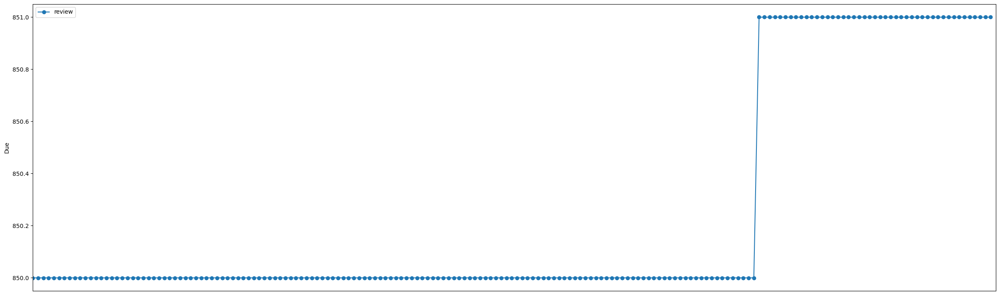

In [15]:
res = invoke('queuedCards', fetch_limit=1000)
df = pd.DataFrame(res)

qs = sorted(df['queue'].unique())
fig, axs = plt.subplots(len(qs), 1, figsize=(30, len(qs)+8))

for q, ax in zip(qs, axs if isinstance(axs, list) else [axs]):
    qdata = df[df['queue'] == q]
    ax.plot(qdata.index, qdata.due, marker="o", label=["new", "learning", "review", "in learning", "preview"][q])
    ax.legend()
    ax.set_ylabel('Due')
    ax.set_xlim((0, len(df)))
    
    ax.set_xticks([])  # Remove x-axis ticks
    ax.xaxis.set_visible(False)  # Hide x-axis

# Remove spacing between subplots
plt.subplots_adjust(hspace=0)

### Get all learned

In [3]:
query = 'deck:Russian::A (is:learn OR is:review)'


learn_or_review_note_ids = invoke('findNotes', query=query)
queued_cards = invoke('queuedCards', fetch_limit=1000)
queued_note_ids = [c['note_id'] for c in queued_cards]
note_ids = list(set(learn_or_review_note_ids) | set(queued_note_ids))
print(len(learn_or_review_note_ids), len(queued_note_ids), len(note_ids))
# cards = invoke('cardsInfo', cards=card_ids)

{'result': [1619783330193, 1619783330195, 1619783330196, 1619783330197, 1619783330198, 1619783330201, 1619783330202, 1619783330203, 1619783330204, 1619783330205, 1619783330208, 1619783330209, 1619783330212, 1619783330213, 1619783330214, 1619783330215, 1619783330222, 1619783330230, 1619783330231, 1619783330232, 1619783330248, 1619783330249, 1619783330250, 1619783330273, 1619783330274, 1619783330275, 1619783330276, 1619783330295, 1619783330296, 1619783330297, 1619783330298, 1619783330299, 1619783330300, 1619783330301, 1619783330302, 1619783330303, 1619783330304, 1619783330305, 1619783330328, 1619783330329, 1619783330330, 1619783330331, 1619783330332, 1619783330367, 1619783330368, 1619783330369, 1619783330370, 1619783330371, 1619783330372, 1619783330373, 1619783330394, 1619783330409, 1619783330410, 1619783330411, 1619783330412, 1619783330413, 1619783330414, 1619783330415, 1619783330416, 1619783330417, 1619783330418, 1619783330489, 1619783330490, 1619783330491, 1619783330492, 1619783330493

In [26]:
cardsInfo = invoke('cardsInfo', cards=card_ids)

{'result': [{'cardId': 1619783331904, 'fields': {'Frequency': {'value': '25', 'order': 0}, 'Word': {'value': 'вы', 'order': 1}, 'Meaning': {'value': 'you', 'order': 2}, 'First Exs': {'value': 'Вы турист или бизнесмен?', 'order': 3}, 'First Tra': {'value': 'Are you a tourist or a businessman?', 'order': 4}, 'Second Exs': {'value': '', 'order': 5}, 'Second Tra': {'value': '', 'order': 6}, 'Third Exs': {'value': '', 'order': 7}, 'Third Tra': {'value': '', 'order': 8}, 'Fourth Exs': {'value': '', 'order': 9}, 'Fourth Tra': {'value': '', 'order': 10}, 'Audio': {'value': ' [sound:googletts-ad7a5b13-e855a705-928a58d3-2bd3e43c-6ddb5b39.mp3]', 'order': 11}, '1st Audio': {'value': ' [sound:googletts-28efb14f-36abac4b-3340880f-375e70db-fd4815ca.mp3]', 'order': 12}, '2nd Audio': {'value': '', 'order': 13}, '3rd Audio': {'value': '', 'order': 14}, '4th Audio': {'value': '', 'order': 15}, 'Length 1': {'value': '24', 'order': 16}, 'Length 2': {'value': '0', 'order': 17}, 'Length 3': {'value': '0', 'o

In [5]:
notesInfo = invoke('notesInfo', notes=note_ids)

{'result': [{'noteId': 1619783333903, 'tags': ['pron'], 'fields': {'Frequency': {'value': '21', 'order': 0}, 'Word': {'value': 'кото́рый', 'order': 1}, 'Meaning': {'value': 'Who, which, what', 'order': 2}, 'First Exs': {'value': 'Мы должны успеть на поезд, который отправляется в 6.15.', 'order': 3}, 'First Tra': {'value': 'We need to make the train which leaves at 6:15.', 'order': 4}, 'Second Exs': {'value': '', 'order': 5}, 'Second Tra': {'value': '', 'order': 6}, 'Third Exs': {'value': '', 'order': 7}, 'Third Tra': {'value': '', 'order': 8}, 'Fourth Exs': {'value': '', 'order': 9}, 'Fourth Tra': {'value': '', 'order': 10}, 'Audio': {'value': ' [sound:googletts-e9192672-ac843635-f0bf50cc-828c2ebd-7b1a3cb7.mp3]', 'order': 11}, '1st Audio': {'value': ' [sound:googletts-c0355726-7023fc06-01a14597-24134cad-76331ba8.mp3]', 'order': 12}, '2nd Audio': {'value': '', 'order': 13}, '3rd Audio': {'value': '', 'order': 14}, '4th Audio': {'value': '', 'order': 15}, 'Length 1': {'value': '55', 'ord

In [6]:
len(notesInfo)

588

In [7]:
notesInfo

[{'noteId': 1619783333903,
  'tags': ['pron'],
  'fields': {'Frequency': {'value': '21', 'order': 0},
   'Word': {'value': 'кото́рый', 'order': 1},
   'Meaning': {'value': 'Who, which, what', 'order': 2},
   'First Exs': {'value': 'Мы должны успеть на поезд, который отправляется в 6.15.',
    'order': 3},
   'First Tra': {'value': 'We need to make the train which leaves at 6:15.',
    'order': 4},
   'Second Exs': {'value': '', 'order': 5},
   'Second Tra': {'value': '', 'order': 6},
   'Third Exs': {'value': '', 'order': 7},
   'Third Tra': {'value': '', 'order': 8},
   'Fourth Exs': {'value': '', 'order': 9},
   'Fourth Tra': {'value': '', 'order': 10},
   'Audio': {'value': ' [sound:googletts-e9192672-ac843635-f0bf50cc-828c2ebd-7b1a3cb7.mp3]',
    'order': 11},
   '1st Audio': {'value': ' [sound:googletts-c0355726-7023fc06-01a14597-24134cad-76331ba8.mp3]',
    'order': 12},
   '2nd Audio': {'value': '', 'order': 13},
   '3rd Audio': {'value': '', 'order': 14},
   '4th Audio': {'valu

In [11]:
data = [[c['fields']['Word']['value'], c['fields']['Meaning']['value'], c['noteId'] in learn_or_review_note_ids, c['noteId'] in queued_note_ids] for c in notesInfo]
df = pd.DataFrame(data, columns=['RUS', 'EN', 'learn_or_review', 'queued'])
df.head()

,RUS,EN,learn_or_review,queued
0,кото́рый,"Who, which, what",True,True
1,что́бы,in order to,True,False
2,де́ло,"business, case",True,False
3,приходи́ть,come,True,False
4,наприме́р,for example,True,False


In [13]:
for c in notesInfo:
    try:
        print(c['fields']['Word']['value']) #, c['fields']['Meaning']['value'])
    except:
        print(c)
        break

кото́рый
что́бы
де́ло
приходи́ть
наприме́р
получа́ться
жизнь
над
о́бщий
лежа́ть
занима́ть
докуме́нт
сообща́ть
зна́ние
небольшо́й
гора́
да́лее
са́мый
да́же
бо́лее
здесь
глаз
приходи́ться
результа́т
у́лица
то́чка
гото́вый
стена́
интере́с
необходи́мый
определя́ть
наве́рное
де́рево
фи́рма
что
от
себя́
слу́чай
явля́ться
земля́
вся́кий
да́нные
умира́ть
сей
магази́н
апре́ль
краси́вый
у́ровень
ме́ра
причи́на
вели́кий
положе́ние
е́сли
при
но́вый
люби́ть
реше́ние
ра́зный
управле́ние
большинство́
фильм
разгово́р
обуче́ние
класс
мину́та
смочь
доро́га
существова́ть
президе́нт
произво́дство
пол
бо́льший
пальто́
дава́ть
систе́ма
гру́ппа
письмо́
движе́ние
це́лый
дире́ктор
раз
понима́ть
хотя́
возвраща́ться
пока́
по́лный
со́бственный
любо́вь
чита́ть
ско́ро
посмотре́ть
речь
ря́дом
немно́го
ма́ло
кто
где
да
мир
вода́
наш
вот
мой
их
о́ба
ваш
куда́
всё
хоте́ть
там
тут
мы
любо́й
сто́ить
ну́жный
нет
идти́
ви́деть
внима́ние
ино́й
поско́льку
вполне́
о́чень
жить
встава́ть
в
начина́ть
туда́
ве́тер
си́ла
всегда́
к

## Integrate on example sentences

In [15]:
with open('data/ru-sentences.txt', 'r') as f:
    lines = f.readlines()

sentences = [line.strip() for line in lines]

print(sentences[:5])

['Кто знает, где дом?', 'Да, мир прекрасен.', 'Вода́ чистая и прохладная.', 'Наш дом здесь.', 'Мой брат их друг.']


In [14]:
with open('data/ru-en-sentences.txt', 'r') as f:
    lines = f.readlines()

sentences_ru, sentences_en = [], []
for line in lines:
    r, e = line.split('|')
    sentences_ru.append(r.strip())
    sentences_en.append(e.strip())

print(sentences_ru[:5])
print(sentences_en[:5])

['Я чита́ю кни́гу.', 'Он люби́т ко́фе.', 'Она́ идёт в магази́н.', 'Мы живём в большо́м доме́.', 'Де́ти игра́ют на у́лице.']
['I am reading a book.', 'He loves coffee.', 'She is going to the store.', 'We live in a big house.', 'Children are playing on the street.']


In [23]:
for sentence in sentences_ru[:5]:
    prepared_sentence = prepare_sentence(sentence, morph, trans_trie)
    sentence_difficulty = calc_sentence_difficulty(prepared_sentence)
    print(sentence, sentence_difficulty)

Warning, the word "кни́гу" is nor in Anki not in our dictionary.
Я чита́ю кни́гу. 600
Он люби́т ко́фе. 600
Она́ идёт в магази́н. 400
Warning, the word "доме́" is nor in Anki not in our dictionary.
Мы живём в большо́м доме́. 800
Warning, the word "Де́ти" is nor in Anki not in our dictionary.
Де́ти игра́ют на у́лице. 800


In [47]:
for word, trans, hit, data in result:
    print(word, end=" ")

print()

for word, trans, hit, data in result:
    print(trans if trans else word, end=" ")

Кто знает , где дом ? 
who know , where home, house ? 